In [2]:
!pip install moviepy
!pip install assemblyai
!pip install librosa
!pip install pydub
!pip install noisereduce
!pip install soundfile
!pip install huggingface_hub
!pip install transformer
!pip install evaluate
!pip install jiwer
!pip install sentencepiece
!pip install tensorflow_io
!pip install torchaudio
!pip install tensorflow
!pip install editdistance
# !pip install tf-keras==2.16

ERROR: Could not find a version that satisfies the requirement transformer (from versions: none)
ERROR: No matching distribution found for transformer


In [3]:
from moviepy.editor import *
import librosa
import numpy as np
import matplotlib.pyplot as plt
import os
import assemblyai as aai
import pandas as pd
from pydub import AudioSegment
from pydub.silence import split_on_silence
import noisereduce as nr
import soundfile as sf
import tensorflow as tf
import torchaudio


In [ ]:
# print(tf.__version__)


#### Extracting Audio from Video

In [1]:
def video_to_audio():

  folder_path = 'C:/Users/Harsh Patel/Desktop/Vintel/videos'
  for filename in os.listdir(folder_path):
      file_path = os.path.join(folder_path, filename)
      if os.path.isfile(file_path) and filename.endswith(('.mp4', '.mov', '.avi', '.mkv')):
            print(f"Processing video file: {filename}")

            # Open the video file and extract audio
            videoclip = VideoFileClip(file_path)
            audioclip = videoclip.audio

            # Write the audio file to mp3 format
            audio_output_path = f"audios/audiofile_{filename.split('.')[0]}.mp3"
            audioclip.write_audiofile(audio_output_path, codec="libmp3lame")
            print(f"Audio saved as: {audio_output_path}")


#### Loading and PReprocessing Audio and Transcripts

In [4]:
import os
from datasets import Dataset, DatasetDict
import soundfile as sf

def load_and_preprocess_data(audio_dir, transcript_dir):
    data = {'label': [], 'audio': [], 'transcript':[]}

    # Process audio files
    for index, audio_file in enumerate(os.listdir(audio_dir)):
        if audio_file.endswith('.mp3'):  # Adjust for audio file types
            file_path = os.path.join(audio_dir, audio_file)

            # Assuming preprocess_audio returns the processed audio and sample rate (sr)
#             processed_audio, sr = audio_reader(file_path)
            processed_audio, sample_rate = librosa.load(file_path, sr=16000, mono=True)

            # Append processed audio to the data dictionary
            data['audio'].append(processed_audio)

    # Process transcript files
    for index, transcript_file in enumerate(os.listdir(transcript_dir)):
        if transcript_file.endswith('.txt'):  # Adjust for transcript file types
            file_path = os.path.join(transcript_dir, transcript_file)

            # Read the transcript content and append it
            with open(file_path, 'r') as content:
                data['transcript'].append(content.read())

    # Ensure the label count matches the number of audios/transcripts
    num_entries = min(len(data['audio']), len(data['transcript']))  # Match the number of entries
    data['audio'] = data['audio'][:num_entries]  # Trim excess audio if necessary
    data['transcript'] = data['transcript'][:num_entries]  # Trim excess transcript if necessary

    data['label'] = [1] * num_entries  # Create a list of labels (e.g., all set to '1')

    return data

# Load and preprocess the audio and transcript data
audio_data1 = load_and_preprocess_data('/content/sample_data/audios', '/content/sample_data/transcripts')

train_dict = {k: v[:8] for k, v in audio_data1.items()}
test_dict = {k: v[8:] for k, v in audio_data1.items()}


# Convert it into a Hugging Face dataset
dataset1 = DatasetDict({
    'train': Dataset.from_dict(train_dict),
    'test': Dataset.from_dict(test_dict)# Split later into train/test if needed
})

print(dataset1)


DatasetDict({
    train: Dataset({
        features: ['label', 'audio', 'transcript'],
        num_rows: 8
    })
    test: Dataset({
        features: ['label', 'audio', 'transcript'],
        num_rows: 3
    })
})


#### Tensorflow Pretrained model approach.

In [ ]:
from transformers import Speech2TextProcessor, TFSpeech2TextForConditionalGeneration


processor_tf = Speech2TextProcessor.from_pretrained("facebook/s2t-small-librispeech-asr")
model_tf = TFSpeech2TextForConditionalGeneration.from_pretrained("facebook/s2t-small-librispeech-asr")

2024-09-10 16:32:54.375402: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
All PyTorch model weights were used when initializing TFSpeech2TextForConditionalGeneration.

All the weights of TFSpeech2TextForConditionalGeneration were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFSpeech2TextForConditionalGeneration for predictions without further training.


In [ ]:
# max_length = 1024  # Define a max length for the input sequence

input_features = processor_tf(
    dataset1['train']["audio"],
    sampling_rate=16000,
    return_tensors="tf",
    padding=True,  # Apply padding
    # max_length=max_length,  # Truncate to max_length
    # truncation=True  # Ensure truncation is applied
)

# Check input shape again
print(input_features['input_features'].shape)


input_labels = processor_tf.tokenizer(
    dataset1['train']["transcript"],
#     sampling_rate=16000,
    return_tensors="tf",
    padding=True,

    # max_length=max_length,  # Truncate to max_length
    # truncation=True  # Ensure truncation is applied
)

# Check input shape again
print(input_labels['input_ids'].shape)


Token indices sequence length is longer than the specified maximum sequence length for this model (2606 > 1024). Running this sequence through the model will result in indexing errors


(8, 170523, 80)
(8, 5452)


In [ ]:
padded_inputs= np.array(input_features['input_features'], dtype= np.float32)
padded_labels = np.array(input_labels['input_ids'], dtype= np.float32)

print(padded_inputs.shape)  # Should output (num_samples, sequence_length, num_features)
print(padded_labels.shape)


(8, 170523, 80)
(8, 5452)


In [ ]:
import jiwer

def wer_metric(y_true, y_pred):
    # Convert the tensors to text sequences
    y_true_text = processor_tf.batch_decode(y_true, skip_special_tokens=True)
    y_pred_text = processor_tf.batch_decode(y_pred, skip_special_tokens=True)

    # Calculate WER using jiwer
    wer_score = jiwer.wer(y_true_text, y_pred_text)

    return wer_score


In [ ]:
model_tf.compile(optimizer= optimizer, loss= tf.keras.losses.CategoricalCrossentropy(), metrics=['accuracy'])

#### Building our own Model.

In [5]:
audio_data= audio_data1['audio']
label_data= audio_data1['transcript']

#### Visualize your audio signal on graph.

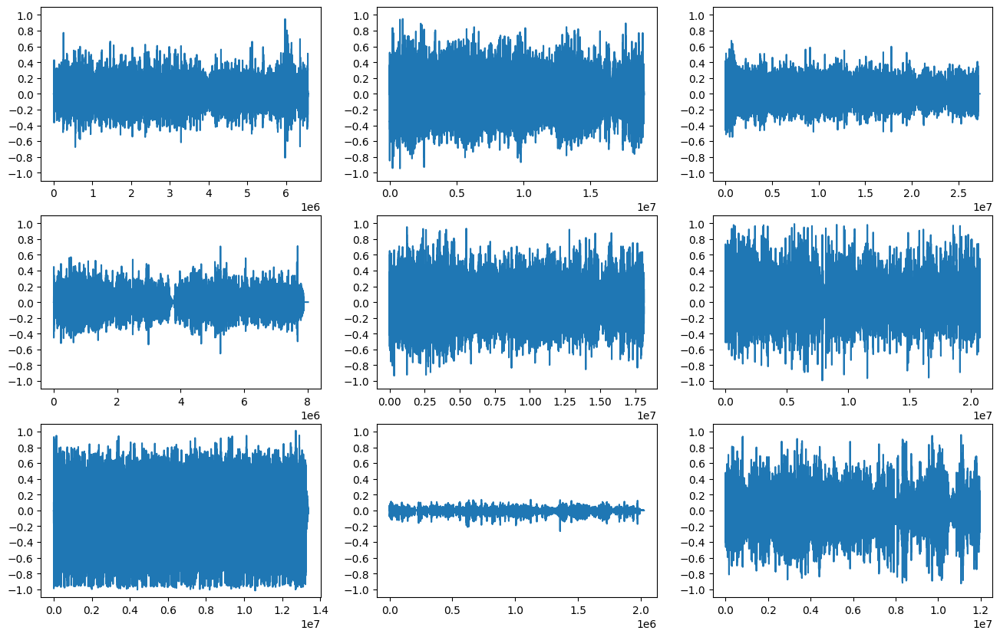

In [6]:
plt.figure(figsize=(16, 10))
rows = 3
cols = 3
n = rows * cols
for i in range(n):
  plt.subplot(rows, cols, i+1)
  audio_signal = audio_data[i]
  plt.plot(audio_signal)
  # plt.title(label_names[example_labels[i]])
  plt.yticks(np.arange(-1.2, 1.2, 0.2))
  plt.ylim([-1.1, 1.1])

#### Create a Spectrogram

In [7]:
def get_spectrogram(waveform):
  # Convert the waveform to a spectrogram via a STFT.
  spectrogram = tf.signal.stft(
      waveform, frame_length=255, frame_step=128)
  # Obtain the magnitude of the STFT.
  spectrogram = tf.abs(spectrogram)
  # Add a `channels` dimension, so that the spectrogram can be used
  # as image-like input data with convolution layers (which expect
  # shape (`batch_size`, `height`, `width`, `channels`).
  spectrogram = spectrogram[..., tf.newaxis]
  return spectrogram

In [8]:
from IPython.display import display, Audio

# for i in range(3):
  # label = label_names[example_labels[i]]
waveform = audio_data[0]
spectrogram = get_spectrogram(waveform)

print('Waveform shape:', waveform.shape)
print('Spectrogram shape:', spectrogram.shape)
print('Audio playback')
display(Audio(waveform, rate=16000))

Waveform shape: (6566574,)
Spectrogram shape: (51300, 129, 1)
Audio playback


#### Visualize your audio signal and Spectrogram

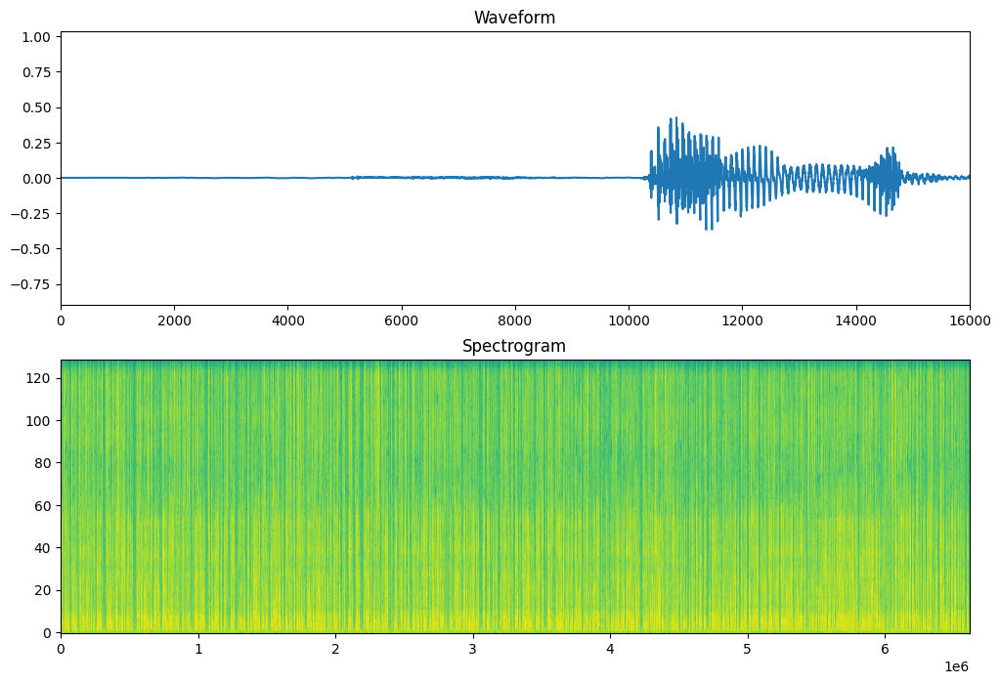

In [9]:
def plot_spectrogram(spectrogram, ax):
  if len(spectrogram.shape) > 2:
    assert len(spectrogram.shape) == 3
    spectrogram = np.squeeze(spectrogram, axis=-1)
  # Convert the frequencies to log scale and transpose, so that the time is
  # represented on the x-axis (columns).
  # Add an epsilon to avoid taking a log of zero.
  log_spec = np.log(spectrogram.T + np.finfo(float).eps)
  height = log_spec.shape[0]
  width = log_spec.shape[1]
  X = np.linspace(0, np.size(spectrogram), num=width, dtype=int)
  Y = range(height)
  ax.pcolormesh(X, Y, log_spec)


fig, axes = plt.subplots(2, figsize=(12, 8))
timescale = np.arange(waveform.shape[0])
axes[0].plot(timescale, waveform)
axes[0].set_title('Waveform')
axes[0].set_xlim([0, 16000])

plot_spectrogram(spectrogram.numpy(), axes[1])
axes[1].set_title('Spectrogram')
# plt.suptitle(label.title())
plt.show()

#### Tokenize your target so that it can be used for training. 

In [10]:
from transformers import BertTokenizerFast

# Load a pre-trained BERT tokenizer (fast version)
tokenizer = BertTokenizerFast.from_pretrained('bert-base-uncased')


# Tokenize the text
tokens = tokenizer.tokenize(label_data[3])
print("Tokens:", tokens)

# Convert tokens back to input IDs (for model inputs)
input_ids = tokenizer.convert_tokens_to_ids(tokens)
print("Input IDs:", input_ids)

# Detokenize (convert tokens back to string)
detokenized_text = tokenizer.convert_tokens_to_string(tokens)
print("Detokenized Text:", detokenized_text)


The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(

  warnings.warn(

Token indices sequence length is longer than the specified maximum sequence length for this model (2254 > 512). Running this sequence through the model will result in indexing errors


Tokens: ['our', 'cat', 'teacher', 'is', 'going', 'to', 'teach', 'you', 'co', '##sin', '##e', 'similarity', 'and', 'co', '##sin', '##e', 'distance', 'how', 'it', 'is', 'used', 'in', 'data', 'science', '.', 'we', "'", 'll', 'look', 'at', 'some', 'theory', 'and', 'then', 'we', "'", 'll', 'move', 'into', 'python', 'code', '.', 'let', "'", 's', 'say', 'you', 'are', 'data', 'scientist', 'working', 'for', 'some', 'financial', 'company', 'where', 'on', 'a', 'google', 'drive', 'you', 'have', 'bunch', 'of', 'financial', 'documents', '.', 'now', ',', 'you', 'don', "'", 't', 'know', 'for', 'what', 'is', 'the', 'company', 'associated', 'with', 'each', 'of', 'these', 'documents', ',', 'but', 'when', 'you', 'open', 'the', 'document', ',', 'when', 'you', 'read', 'it', ',', 'you', 'can', 'kind', 'of', 'figure', 'out', 'that', 'this', 'is', 'probably', 'about', 'apple', '.', 'why', '?', 'because', 'iphone', 'is', 'mentioned', 'so', 'many', 'times', '.', 'so', 'when', 'you', "'", 're', 'reading', 'about'

#### Since the data is of varied length, we need to pad the x train and y train data. Tensorflow expects both xtrain and ytrain to be in the same shape. 

In [11]:
from tensorflow.keras.preprocessing.sequence import pad_sequences
import numpy as np

max_len= 1024
# Convert data to numpy arrays if they are not already
spectrogram = np.array(spectrogram)  # Shape: (104387, 129, 1)
input_ids = np.array(input_ids).reshape(-1,1)  # Assuming shape: (2241,)

# Ensure you have the same number of samples for both input and target
num_samples = len(spectrogram)

# For padding spectrograms
x_train_padded = pad_sequences(
    [x.flatten() for x in spectrogram],  # Flatten each spectrogram
    maxlen=max_len,
    padding='post',
    dtype='int32'
)
x_train_padded = x_train_padded.reshape((num_samples, max_len, 1))  # Reshape back to (num_samples, max_len, 1)

# Ensure input_ids matches the number of samples in x_train_padded
y_train_padded = pad_sequences(
    input_ids,
    maxlen=max_len,
    padding='post',
    dtype='int32'
)

# Reshape y_train_padded to match x_train_padded
if y_train_padded.shape[0] < num_samples:
    # If y_train_padded has fewer samples, you need to adjust
    y_train_padded = np.pad(y_train_padded, ((0, num_samples - y_train_padded.shape[0]), (0, 0)), mode='constant')

# Check the shapes
print(f"x_train_padded shape: {x_train_padded.shape}")
print(f"y_train_padded shape: {y_train_padded.shape}")

# Ensure that x_train_padded and y_train_padded have the same number of samples
# assert x_train_padded.shape[0] == y_train_padded.shape[0], "Mismatch in number of samples"

# # Fit the model
# EPOCHS = 10
# history = model.fit(
#     x=x_train_padded,
#     y=y_train_padded,
#     batch_size=8,
#     epochs=EPOCHS,
#     # callbacks=tf.keras.callbacks.EarlyStopping(verbose=1, patience=2),
# )


x_train_padded shape: (51300, 1024, 1)
y_train_padded shape: (51300, 1024)


In [12]:
# def ctc_loss_lambda_func(y_true, y_pred):
#     # Compute input length based on the model's predictions (shape: [batch_size, max_time_steps, num_classes])
#     input_length = tf.fill([tf.shape(y_pred)[0]], tf.shape(y_pred)[1])  # Sequence length for each batch element

#     # Calculate the label length (number of non-zero elements in each label sequence, assuming padded with 0s)
#     label_length = tf.reduce_sum(tf.cast(tf.not_equal(y_true, 0), tf.int32), axis=-1)  # Label lengths

#     # Convert dense labels to sparse format required by CTC loss
#     y_true_sparse = tf.keras.backend.ctc_label_dense_to_sparse(y_true, label_length)

#     # Compute the CTC loss
#     ctc_loss = tf.keras.backend.ctc_batch_cost(y_true_sparse, y_pred, input_length, label_length)

#     return tf.reduce_mean(ctc_loss)

#### Evalutation metric for speech-to-text task.

In [ ]:
import editdistance


def wer(reference, hypothesis):
    """
    Calculate Word Error Rate.
    :param reference: List of lists, where each inner list is a list of words in a reference transcript.
    :param hypothesis: List of lists, where each inner list is a list of words in a predicted transcript.
    :return: WER score
    """
    # Flatten the lists
    reference = [word for sublist in reference for word in sublist]
    hypothesis = [word for sublist in hypothesis for word in sublist]

    # Compute the WER
    distance = editdistance.eval(reference, hypothesis)
    wer_score = distance / len(reference) if len(reference) > 0 else float('inf')
    return wer_score

#### Wav2Vec2 replica in TensorFlow.

In [ ]:
# def ctc_loss(y_true, y_pred):
#     # Check if y_true is already a SparseTensor
#     if isinstance(y_true, tf.sparse.SparseTensor):
#         y_true_sparse = y_true
#     else:
#         # Convert dense tensor to SparseTensor
#         y_true_indices = tf.where(tf.not_equal(y_true, 0))
#         y_true_values = tf.gather_nd(y_true, y_true_indices)
#         y_true_dense_shape = tf.shape(y_true)

#         y_true_sparse = tf.sparse.SparseTensor(
#             indices=tf.cast(y_true_indices, tf.int64),
#             values=tf.cast(y_true_values, tf.int32),
#             dense_shape=tf.cast(y_true_dense_shape, tf.int64)
#         )

#     # Calculate sequence lengths and logit lengths
#     label_length = tf.reduce_sum(tf.cast(tf.not_equal(y_true, 0), tf.int32), axis=1)
#     logits_length = tf.reduce_sum(tf.cast(tf.not_equal(y_pred, 0), tf.int32), axis=1)

#     # Ensure correct dtype
#     label_length = tf.cast(label_length, tf.int64)
#     logits_length = tf.cast(logits_length, tf.int64)

#     # Compute CTC loss
#     loss = tf.nn.ctc_loss(
#         labels=y_true_sparse,
#         logits=y_pred,
#         label_length=label_length,
#         logit_length=logits_length,
#         blank_index=-1
#     )

#     return loss

#### Defining the model.

In [12]:
import tensorflow as tf
from tensorflow.keras import layers, Model

# Custom Transformer block
class TransformerBlock(layers.Layer):
    def __init__(self, d_model, num_heads, dff, dropout_rate=0.1):
        super(TransformerBlock, self).__init__()
        self.att = layers.MultiHeadAttention(num_heads=num_heads, key_dim=d_model)
        self.ffn = tf.keras.Sequential([
            layers.Dense(dff, activation='relu'),  # Feed-forward layer
            layers.Dense(d_model)  # Output layer
        ])
        self.layernorm1 = layers.LayerNormalization(epsilon=1e-6)
        self.layernorm2 = layers.LayerNormalization(epsilon=1e-6)
        self.dropout1 = layers.Dropout(dropout_rate)
        self.dropout2 = layers.Dropout(dropout_rate)

    def call(self, x, training, mask=None):
        attn_output = self.att(x, x, x, attention_mask=mask)  # Self-attention
        attn_output = self.dropout1(attn_output, training=training)
        out1 = self.layernorm1(x + attn_output)  # Residual connection + normalization

        ffn_output = self.ffn(out1)  # Feed-forward network
        ffn_output = self.dropout2(ffn_output, training=training)
        return self.layernorm2(out1 + ffn_output)  # Residual connection + normalization

class PositionalEncoding(tf.keras.layers.Layer):
    def __init__(self, position, d_model):
        super(PositionalEncoding, self).__init__()
        self.pos_encoding = self.positional_encoding(position, d_model)

    def get_angles(self, pos, i, d_model):
        angle_rates = 1 / tf.pow(10000, (2 * (i // 2)) / tf.cast(d_model, tf.float32))
        return pos * angle_rates

    def positional_encoding(self, position, d_model):
        angle_rads = self.get_angles(
            pos=tf.range(position, dtype=tf.float32)[:, tf.newaxis],
            i=tf.range(d_model, dtype=tf.float32)[tf.newaxis, :],
            d_model=d_model
        )
        # Apply sin to even indices and cos to odd indices
        angle_rads = tf.concat([
            tf.math.sin(angle_rads[:, 0::2]),
            tf.math.cos(angle_rads[:, 1::2])
        ], axis=-1)

        pos_encoding = angle_rads[tf.newaxis, ...]
        return tf.cast(pos_encoding, tf.float32)

    def call(self, x):
        seq_len = tf.shape(x)[1]
        return self.pos_encoding[:, :seq_len, :]

class MaskedWav2Vec2WithTransformer(tf.keras.Model):
    def __init__(self, d_model=128, num_heads=8, dff=512, max_pos_encoding=1024):
        super(MaskedWav2Vec2WithTransformer, self).__init__()
        # Masking layer to ignore padded parts
        self.masking = layers.Masking(mask_value=0)

        # Add a casting layer to cast inputs to float32
        self.cast_to_float = layers.Lambda(lambda x: tf.cast(x, tf.float32))

        # Convolution layers for feature extraction
        self.conv1 = layers.Conv1D(filters=64, kernel_size=5, padding='same', activation='relu')
        self.conv2 = layers.Conv1D(filters=128, kernel_size=5, padding='same', activation='relu')

        # Positional encoding
        self.pos_encoding = PositionalEncoding(max_pos_encoding, d_model)

        # Transformer block
        self.transformer_block = TransformerBlock(d_model=d_model, num_heads=num_heads, dff=dff)

        # Dense output layer
        self.final_layer = layers.Dense(vocab_size)  # vocab_size depends on your vocabulary

    def call(self, inputs, training=False):
        # Apply masking to ignore padded parts
        x = self.masking(inputs)

        # Cast input to float32
        x = self.cast_to_float(x)

        # Apply convolutional layers
        x = self.conv1(x)
        x = self.conv2(x)

        # Add positional encoding
        x = x + self.pos_encoding(x)

        # Apply transformer block
        x = self.transformer_block(x, training=training)

        # Final dense layer for output
        return self.final_layer(x)

vocab_size= 30
# Create model instance
model_1 = MaskedWav2Vec2WithTransformer()

# Compile the model
model_1.compile(optimizer= 'adam', loss= tf.keras.losses.CTC(reduction="sum_over_batch_size", name="ctc", dtype=None) , metrics= ['accuracy'])


#### This is Data Distribution Stratergy for multi processing.

In [13]:
# stratergy= tf.distribute.MirroredStrategy(devices= ['/gpu:0'], cross_device_ops=tf.distribute.HierarchicalCopyAllReduce())

# with stratergy.scope():
#     model_1 = MaskedWav2Vec2WithTransformer()
#     model_1.compile(optimizer= 'adam', loss= tf.keras.losses.CTC(reduction="sum_over_batch_size", name="ctc", dtype=None) , metrics= ['accuracy'])



In [1]:
history = model_1.fit(
    x=x_train_padded,
    y=y_train_padded,
    batch_size=32,
    epochs=5
)

NameError: name 'model_1' is not defined

#### Evaluate the model

In [ ]:
predictions= model_1.predict(x_train_padded)

#### Convert the tokens back to words.

In [ ]:
token_ids = predictions.flatten() # Get the first example from the padded labels

# Convert token IDs to token strings
token_strings = tokenizer.convert_ids_to_tokens(token_ids)

# Now convert tokens to the final string
detokenized_text = tokenizer.convert_tokens_to_string(token_strings)

# Print the detokenized text
print("Detokenized Text:", detokenized_text[:500])

### Pytorch Implementation

#### Make a pytorch dataset to preprocess dataset.

In [ ]:
import os
import torch
import torchaudio
from torch.utils.data import Dataset
from transformers import Wav2Vec2Tokenizer

class SpeechDataset(Dataset):
    def __init__(self, audio_files, transcripts, tokenizer, feature_extractor):
        self.audio_files = audio_files
        self.transcripts = transcripts
        self.tokenizer = tokenizer
        self.feature_extractor = feature_extractor

    def __len__(self):
        return len(self.audio_files)

    def __getitem__(self, idx):
        audio_file = self.audio_files[idx]
        transcript = self.transcripts[idx]

        if not isinstance(transcript, str):

             raise TypeError(f"Expected transcript to be a string, got {type(transcript)}")


        # Load and preprocess audio
        audio_input, _ = torchaudio.load(audio_file)
        audio_input = self.feature_extractor(audio_input.squeeze().numpy(), sampling_rate=16000, return_tensors="pt").input_values.squeeze()
        audio_input = torch.tensor(audio_input, dtype=torch.float32)

        # Tokenize transcript
        target = self.tokenizer(transcript, return_tensors="pt").input_ids.squeeze()
        target = torch.tensor(target, dtype=torch.float32)

        return {
            'input_values': audio_input,
            'labels': target
        }


#### Take a pretrained model and initialize the model.

In [ ]:
import torch
from torch.utils.data import DataLoader
from transformers import Wav2Vec2ForCTC, Wav2Vec2FeatureExtractor, Wav2Vec2Tokenizer, AutoTokenizer, AutoFeatureExtractor, AutoModelForCTC
from transformers import AdamW

# Initialize the tokenizer and feature extractor
# tokenizer = Wav2Vec2Tokenizer.from_pretrained("facebook/wav2vec2-base-960h")
# feature_extractor = Wav2Vec2FeatureExtractor.from_pretrained("facebook/wav2vec2-base-960h")

model = AutoModelForCTC.from_pretrained("facebook/wav2vec2-base-960h")
tokenizer = AutoTokenizer.from_pretrained("facebook/wav2vec2-base-960h")
feature_extractor = AutoFeatureExtractor.from_pretrained("facebook/wav2vec2-base-960h")


# Load your dataset
audio_files = ["audios/audio_1.mp3"]  # List of paths to your audio files
transcripts = ["transcripts/transcript_1.txt"]  # Corresponding transcripts

dataset = SpeechDataset(audio_files, transcripts, tokenizer, feature_extractor)
# torch.
# Create DataLoader with multiprocessing
dataloader = DataLoader(dataset, batch_size=1, shuffle=False, num_workers=0)  # Adjust num_workers based on your CPU

# Initialize model


Some weights of the model checkpoint at facebook/wav2vec2-base-960h were not used when initializing Wav2Vec2ForCTC: ['wav2vec2.encoder.pos_conv_embed.conv.weight_g', 'wav2vec2.encoder.pos_conv_embed.conv.weight_v']
- This IS expected if you are initializing Wav2Vec2ForCTC from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing Wav2Vec2ForCTC from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/wav2vec2-base-960h and are newly initialized: ['wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original0', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original1', 'wav2vec2.masked_spec_embed']
You sho

#### Start to train the pretrained model on your dataset.

In [ ]:
# model = Wav2Vec2ForCTC.from_pretrained("facebook/wav2vec2-base-960h", torch_dtype= torch.float32)
model.train()

# Set up optimizer
optimizer = AdamW(model.parameters(), lr=1e-4)

# Training loop
for epoch in range(3):  # Adjust number of epochs
    for batch in dataloader:
        input_values = batch['input_values']
        labels = batch['labels']

        # Forward pass
        outputs = model(input_values=input_values, labels=labels)
        loss = outputs.loss

        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        print(f"Epoch {epoch}, Loss: {loss.item()}")


RuntimeError: Expected 2D (unbatched) or 3D (batched) input to conv1d, but got input of size: [1, 1, 2, 32967837]

#### The two code bloack below contain the code to train the model using Multi processing stratergies from Pytorch over multiple CPU's.

In [ ]:
import torch
from torch.utils.data import Dataset
from transformers import AutoModelForCTC, AutoTokenizer, AutoFeatureExtractor
import numpy as np
import librosa
import multiprocessing
from multiprocessing import Pool, cpu_count

# Hyperparameters
hyperparams = {
    'epochs': 3,
    'batch_size': 512,
    'learning_rate': 0.001,
    'num_workers': cpu_count(),
    'sampling_rate': 16000  # Define the sampling rate
}

# Load model and tokenizer
model_name = "facebook/wav2vec2-base-960h"
model = AutoModelForCTC.from_pretrained(model_name)
tokenizer = AutoTokenizer.from_pretrained(model_name)
feature_extractor = AutoFeatureExtractor.from_pretrained(model_name)

# Dummy dataset class
class SpeechDataset(Dataset):
    def __init__(self, audio_files, transcripts, sampling_rate):
        self.audio_files = audio_files
        self.transcripts = transcripts
        self.feature_extractor = feature_extractor
        self.tokenizer = tokenizer
        self.sampling_rate = sampling_rate

    def __len__(self):
        return len(self.audio_files)

    def __getitem__(self, idx):
        audio_file = self.audio_files[idx]
        transcript = self.transcripts[idx]

        # Load and process audio
        audio_input, _ = librosa.load(audio_file, sr=self.sampling_rate)
        audio_input = self.feature_extractor(audio_input, return_tensors="pt", sampling_rate=self.sampling_rate).input_values.squeeze()

        # Tokenize transcript
        target = self.tokenizer(transcript, return_tensors="pt").input_ids.squeeze()

        return {'input_values': audio_input, 'labels': target}

# Data preprocessing function
def preprocess_data(idx, audio_files, transcripts, sampling_rate):
    dataset = SpeechDataset(audio_files, transcripts, sampling_rate)
    return dataset[idx]

# Example file paths and transcripts
audio_files = ["audios/audio_1.mp3"]  # List of paths to your audio files
transcripts = ["transcripts/transcript_1.txt"]  # Corresponding transcripts

# Create dataset
dataset = SpeechDataset(audio_files, transcripts, hyperparams['sampling_rate'])

# Multiprocessing for data loading
def load_data_in_parallel(audio_files, transcripts, sampling_rate):
    with Pool(2) as pool:
        results = pool.starmap(preprocess_data, [(i, audio_files, transcripts, sampling_rate) for i in range(len(audio_files))])
    return results

# Load data
data = load_data_in_parallel(audio_files, transcripts, hyperparams['sampling_rate'])

# Training loop
device = torch.device("gpu")
model.to(device)
model.train()

optimizer = torch.optim.AdamW(model.parameters(), lr=hyperparams['learning_rate'])

for epoch in range(hyperparams['epochs']):
    for item in data:
        input_values = item['input_values'].unsqueeze(0).to(device)  # Add batch dimension
        labels = item['labels'].unsqueeze(0).to(device)  # Add batch dimension

        optimizer.zero_grad()

        # Forward pass
        outputs = model(input_values, labels=labels)
        loss = outputs.loss

        # Backward pass
        loss.backward()
        optimizer.step()

        print(f"Epoch {epoch+1}, Loss: {loss.item()}")

print("Training complete!")


Some weights of the model checkpoint at facebook/wav2vec2-base-960h were not used when initializing Wav2Vec2ForCTC: ['wav2vec2.encoder.pos_conv_embed.conv.weight_g', 'wav2vec2.encoder.pos_conv_embed.conv.weight_v']
- This IS expected if you are initializing Wav2Vec2ForCTC from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing Wav2Vec2ForCTC from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/wav2vec2-base-960h and are newly initialized: ['wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original0', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original1', 'wav2vec2.masked_spec_embed']
You sho

KeyboardInterrupt: 

In [ ]:
import torch
from transformers import AutoModelForCTC, AutoTokenizer, AutoFeatureExtractor
import librosa
import os
from multiprocessing import Pool, cpu_count
import numpy as np

# Hyperparameters
hyperparams = {
    'epochs': 3,
    'batch_size': 170000,  # Adjust batch size according to memory constraints
    'learning_rate': 0.001,
    'num_workers': 4,
    'sampling_rate': 16000  # Define the sampling rate
}

# Load model and tokenizer
model_name = "facebook/wav2vec2-base-960h"
model = AutoModelForCTC.from_pretrained(model_name)
tokenizer = AutoTokenizer.from_pretrained(model_name)
feature_extractor = AutoFeatureExtractor.from_pretrained(model_name)

class SpeechDataset:
    def __init__(self, audio_files, transcripts, sampling_rate):
        self.audio_files = audio_files
        self.transcripts = transcripts
        self.sampling_rate = sampling_rate

    def __len__(self):
        return len(self.audio_files)

    def __getitem__(self, idx):
        audio_file = self.audio_files[idx]
        transcript = self.transcripts[idx]

        # Load and process audio
        audio_input, _ = librosa.load(audio_file, sr=self.sampling_rate)
        audio_input = feature_extractor(audio_input, return_tensors="pt", sampling_rate=self.sampling_rate).input_values.squeeze()

        # Tokenize transcript
        target = tokenizer(transcript, return_tensors="pt").input_ids.squeeze()

        return {'input_values': audio_input.numpy(), 'labels': target.numpy()}

# Data preprocessing function
def preprocess_data(index, audio_files, transcripts, sampling_rate):
    dataset = SpeechDataset(audio_files, transcripts, sampling_rate)
    return dataset[index]

# Load example file paths and transcripts
audio_files = ["audios/audio_1.mp3"]  # List of paths to your audio files
transcripts = ["transcripts/transcript_1.txt"]  # Corresponding transcripts

# Create dataset
dataset = SpeechDataset(audio_files, transcripts, hyperparams['sampling_rate'])

# Function to load data in parallel
def load_data_in_parallel(audio_files, transcripts, sampling_rate, batch_size):
    with Pool(hyperparams['num_workers']) as pool:
        indices = list(range(len(audio_files)))
        results = pool.starmap(preprocess_data, [(i, audio_files, transcripts, sampling_rate) for i in indices])

    # Group results into batches
    batches = [results[i:i + batch_size] for i in range(0, len(results), batch_size)]
    return batches

# Load data
data_batches = load_data_in_parallel(audio_files, transcripts, hyperparams['sampling_rate'], hyperparams['batch_size'])

# Training loop
device = torch.device("cpu")
model.to(device)
model.train()

optimizer = torch.optim.AdamW(model.parameters(), lr=hyperparams['learning_rate'])

for epoch in range(hyperparams['epochs']):
    total_loss = 0
    for batch in data_batches:
        input_values = torch.tensor([item['input_values'] for item in batch]).to(device)
        labels = torch.tensor([item['labels'] for item in batch]).to(device)

        optimizer.zero_grad()

        # Forward pass
        outputs = model(input_values, labels=labels)
        loss = outputs.loss
        total_loss += loss.item()

        # Backward pass
        loss.backward()
        optimizer.step()

    print(f"Epoch {epoch+1}, Average Loss: {total_loss / len(data_batches)}")

print("Training complete!")


#### Silero Model

In [ ]:
!pip install omegaconf

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 17.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 53.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.9.3-py3-none-any.whl size=144554 sha256=610094fb227983d64502d34eacebaf8fa372fa59ca399658638140dd595ed903
  Stored in directory: /home/jovyan/.cache/pip/wheels/b1/a3/c2/6df046c09459b73cc9bb6c4401b0be6c47048baf9a1617c485
Successfully built antlr4-python3-runtime

[notice] A new release of pip is available: 23.1.2 -> 24.2
[notice] To update, run: python3 -m pip install --upgrade pip


In [ ]:
import torch
import zipfile
import torchaudio
from glob import glob

device = torch.device('cpu')  # gpu also works, but our models are fast enough for CPU
model, decoder, utils = torch.hub.load(repo_or_dir='snakers4/silero-models',
                                       model='silero_stt',
                                       language='en', # also available 'de', 'es'
                                       device=device)
(read_batch, split_into_batches,
 read_audio, prepare_model_input) = utils  # see function signature for details

# download a single file in any format compatible with TorchAudio
# torch.hub.download_url_to_file('https://opus-codec.org/static/examples/samples/speech_orig.wav',
#                                dst ='speech_orig.wav', progress=True)
test_files = glob('audios/audio_1.mp3')
batches = split_into_batches(test_files, batch_size=3)
input = prepare_model_input(read_batch(batches[0]),
                            device=device)

output = model(input)
for example in output:
    print(decoder(example.cpu()))

Using cache found in /home/jovyan/.cache/torch/hub/snakers4_silero-models_master
